# Plant Micro RNAs Classification
---
---

In [46]:
import multiprocessing

SEED = 42 # Seed for reproducibility
print('Availables CPU cores: ', multiprocessing.cpu_count())

Availables CPU cores:  8


---
## Data Exploration and Preprocessing

In [44]:
import pandas as pd
import numpy as np

dataset = pd.read_csv('Plants_data.csv', sep=',')

# Get dataset dimensions
matrix = np.matrix(dataset)
print('\n> Plants dataset:', matrix.shape[0], 'samples,', matrix.shape[1], 'features')
print(f"\n- miRNAs samples: {dataset[dataset['type'] == 'miRNA'].shape[0]}")
print(f"- Random samples: {dataset[dataset['type'] == 'rand'].shape[0]}")

dataset


> Plants dataset: 75351 samples, 29 features

- miRNAs samples: 35353
- Random samples: 39998


,mer,type,in_db,mer6,mer7,mer8,gc,gcs,cpg,cwf,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
0,ATTGGATAACGGGAT,miRNA,1,990,240,63,0.400000,0.666667,0.2000,1.731983,...,0.543956,0.498626,0.498626,0.498626,1.0,0.722222,0.774194,0.813953,0.851852,0.875000
1,TAGAGAGGTGGTACA,miRNA,1,1313,204,50,0.466667,0.714286,0.0000,1.737050,...,0.439560,0.402930,0.402930,0.402930,1.0,0.666667,0.709677,0.767442,0.814815,0.843750
2,TTCTAAGTGGGCTAG,miRNA,1,754,156,46,0.466667,0.428571,0.0000,1.712485,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
3,TGGACCAGGCTTCAT,miRNA,4,885,390,232,0.533333,0.000000,0.0000,1.700613,...,0.857143,0.857143,0.857143,0.857143,1.0,0.888889,0.935484,0.953488,0.962963,0.968750
4,CATCTTCAAGATTCA,miRNA,4,1512,447,175,0.333333,0.600000,0.0000,1.731983,...,0.483516,0.443223,0.443223,0.443223,1.0,0.666667,0.741935,0.790698,0.833333,0.859375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75346,TAATGCTCCAAAGTT,rand,0,703,122,13,0.333333,0.200000,0.0000,1.712485,...,0.857143,0.857143,0.857143,0.857143,1.0,0.888889,0.935484,0.953488,0.962963,0.968750
75347,AACCTTATCTGGGCG,rand,0,662,161,32,0.533333,0.000000,0.0625,1.700613,...,0.857143,0.857143,0.857143,0.857143,1.0,0.888889,0.935484,0.953488,0.962963,0.968750
75348,CATGTCATAAAGCCA,rand,0,735,161,39,0.400000,0.333333,0.0000,1.714448,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
75349,ATGCTGGCTTAGTAG,rand,0,773,137,25,0.466667,0.428571,0.0000,1.712485,...,0.543956,0.543956,0.543956,0.543956,1.0,0.722222,0.774194,0.837209,0.870370,0.890625


### Split data

In [47]:
from sklearn.model_selection import train_test_split

# Split in train and test data
X = dataset.drop(['mer', 'type', 'in_db'], axis=1)
y = dataset['type'].replace(['miRNA','rand'], [1, 0])

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print(f"> Train data : {X_train_val.shape[0]} samples ( {round((X_train_val.shape[0]/X.shape[0])*100, 2)}% )")
print(f"> Test data  : {X_test.shape[0]} samples ( {round((X_test.shape[0]/X.shape[0])*100, 2)}% )")

> Train data : 60280 samples ( 80.0% )
> Test data  : 15071 samples ( 20.0% )


In [48]:
print("- Class distribution:")
print(f"> Train data : {list(y_train_val.value_counts())[0]} Random, {list(y_train_val.value_counts())[1]} miRNA")
print(f"> Test data  : {list(y_test.value_counts())[0]} Random, {list(y_test.value_counts())[1]} miRNA")

- Class distribution:
> Train data : 31942 Random, 28338 miRNA
> Test data  : 8056 Random, 7015 miRNA


In [49]:
from sklearn.preprocessing import MinMaxScaler

# Data normalization
scaler = MinMaxScaler()

X_train_val_std = X_train_val.copy()
X_test_std = X_test.copy()
cols = list(X.columns)

X_train_val_std[cols] = scaler.fit_transform(X_train_val[cols])
X_test_std[cols] = scaler.transform(X_test[cols])

X_train_val_std # Train data normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
21787,0.295409,0.238342,0.126496,0.466667,0.142857,0.000000,0.000000,1.000000,1.000000,0.769934,...,0.707042,0.712509,0.713803,0.714141,1.0,0.692308,0.826087,0.87500,0.900,0.914894
54916,0.161011,0.084629,0.015385,0.466667,0.714286,0.000000,0.250000,0.870970,0.870970,0.644982,...,0.515493,0.524534,0.526675,0.527233,1.0,0.538462,0.695652,0.78125,0.825,0.851064
73273,0.158683,0.075993,0.000000,0.533333,0.250000,0.266667,0.089036,0.942893,0.942893,0.737214,...,0.633803,0.640636,0.642254,0.642676,1.0,0.615385,0.782609,0.84375,0.875,0.893617
10430,0.301397,0.227116,0.141880,0.466667,0.428571,0.000000,0.089036,0.942893,0.942893,0.822491,...,0.780282,0.784381,0.785352,0.785606,1.0,0.769231,0.869565,0.90625,0.925,0.936170
19791,0.258150,0.236615,0.145299,0.466667,0.714286,0.333333,0.273277,0.853897,0.853897,0.769934,...,0.594366,0.601935,0.603728,0.604195,1.0,0.692308,0.739130,0.81250,0.850,0.872340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37194,0.210912,0.126079,0.046154,0.400000,0.333333,0.000000,0.194402,0.864333,0.864333,0.625144,...,0.470423,0.439760,0.442283,0.442942,1.0,0.538462,0.652174,0.71875,0.775,0.808511
6265,0.157685,0.139896,0.105983,0.333333,0.200000,0.000000,0.089036,0.942893,0.942893,0.769934,...,0.650704,0.657222,0.658765,0.659168,1.0,0.692308,0.782609,0.84375,0.875,0.893617
54886,0.140719,0.093264,0.051282,0.466667,0.714286,0.000000,0.273277,0.853897,0.853897,0.684657,...,0.583099,0.590878,0.592720,0.593201,1.0,0.615385,0.739130,0.81250,0.850,0.872340
860,0.209914,0.155440,0.107692,0.466667,0.428571,0.000000,0.169518,0.889254,0.889254,0.664819,...,0.515493,0.524534,0.526675,0.527233,1.0,0.538462,0.695652,0.78125,0.825,0.851064


In [50]:
X_train_val # Train data no normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
21787,993,276,74,0.466667,0.142857,0.000000,1.700613,1.989898,0.994949,0.795501,...,0.714286,0.714286,0.714286,0.714286,1.0,0.777778,0.870968,0.906977,0.925926,0.937500
54916,589,98,9,0.466667,0.714286,0.000000,1.733947,1.806239,0.903119,0.710593,...,0.527473,0.527473,0.527473,0.527473,1.0,0.666667,0.774194,0.837209,0.870370,0.890625
73273,582,88,0,0.533333,0.250000,0.133333,1.712485,1.908613,0.954306,0.773267,...,0.642857,0.642857,0.642857,0.642857,1.0,0.722222,0.838710,0.883721,0.907407,0.921875
10430,1011,263,83,0.466667,0.428571,0.000000,1.712485,1.908613,0.954306,0.831216,...,0.785714,0.785714,0.785714,0.785714,1.0,0.833333,0.903226,0.930233,0.944444,0.953125
19791,881,274,85,0.466667,0.714286,0.166667,1.737050,1.781937,0.890969,0.795501,...,0.604396,0.604396,0.604396,0.604396,1.0,0.777778,0.806452,0.860465,0.888889,0.906250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37194,739,146,27,0.400000,0.333333,0.000000,1.726533,1.796792,0.898396,0.697113,...,0.483516,0.443223,0.443223,0.443223,1.0,0.666667,0.741935,0.790698,0.833333,0.859375
6265,579,162,62,0.333333,0.200000,0.000000,1.712485,1.908613,0.954306,0.795501,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
54886,528,108,30,0.466667,0.714286,0.000000,1.737050,1.781937,0.890969,0.737553,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
860,736,180,63,0.466667,0.428571,0.000000,1.723216,1.832263,0.916131,0.724073,...,0.527473,0.527473,0.527473,0.527473,1.0,0.666667,0.774194,0.837209,0.870370,0.890625


### KFold for CV

In [51]:
from sklearn.model_selection import KFold

# KFold
splits = 5
k_fold = KFold(n_splits=splits, shuffle=True, random_state=SEED)

# Get train and validation folds for cross-validation
index = 0
X_train, X_val, y_train, y_val = [0]*5, [0]*5, [0]*5, [0]*5
X_train_std, X_val_std, y_train_std, y_val_std = [0]*5, [0]*5, [0]*5, [0]*5

print("\n> Kfold indexes for train and validation data:\n")
for train_index, val_index in k_fold.split(X_train_val):
  print("TRAIN:", train_index, "VAL:", val_index)
  # Non normalized data
  X_train[index], X_val[index] = X_train_val.iloc[train_index], X_train_val.iloc[val_index]
  y_train[index], y_val[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  # Normalized data
  X_train_std[index], X_val_std[index] = X_train_val_std.iloc[train_index], X_train_val_std.iloc[val_index]
  y_train_std[index], y_val_std[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  index+=1


> Kfold indexes for train and validation data:

TRAIN: [    0     1     2 ... 60277 60278 60279] VAL: [    4     6     7 ... 60256 60259 60266]
TRAIN: [    2     3     4 ... 60276 60277 60278] VAL: [    0     1    11 ... 60267 60269 60279]
TRAIN: [    0     1     2 ... 60274 60276 60279] VAL: [    3     8    14 ... 60275 60277 60278]
TRAIN: [    0     1     2 ... 60277 60278 60279] VAL: [    5    15    18 ... 60272 60273 60274]
TRAIN: [    0     1     3 ... 60277 60278 60279] VAL: [    2     9    10 ... 60261 60263 60276]


### Check class distribution

In [52]:
miRNA_count = [y.value_counts()[1], y_train_val.value_counts()[1], y_test.value_counts()[1]]
rand_count = [y.value_counts()[0], y_train_val.value_counts()[0], y_test.value_counts()[0]]

print("--- Class distribution ---")
for i in range(splits):
    print(f"\n- Split {i+1}:")
    print(f"> Train data : {list(y_train[i].value_counts())[0]} Random, {list(y_train[i].value_counts())[1]} miRNA")
    print(f"> Val data   : {list(y_val[i].value_counts())[0]} Random, {list(y_val[i].value_counts())[1]} miRNA")

--- Class distribution ---

- Split 1:
> Train data : 25660 Random, 22564 miRNA
> Val data   : 6282 Random, 5774 miRNA

- Split 2:
> Train data : 25504 Random, 22720 miRNA
> Val data   : 6438 Random, 5618 miRNA

- Split 3:
> Train data : 25484 Random, 22740 miRNA
> Val data   : 6458 Random, 5598 miRNA

- Split 4:
> Train data : 25538 Random, 22686 miRNA
> Val data   : 6404 Random, 5652 miRNA

- Split 5:
> Train data : 25582 Random, 22642 miRNA
> Val data   : 6360 Random, 5696 miRNA


All data splits have balanced classes.

---
## Data Distribution Visualization

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

# Divide data by classes
miRNA_data = X[(dataset['type'] == 'miRNA')]
rand_data = X[(dataset['type'] == 'rand')]

# Histograms of features distribution
k = 1
fig = plt.figure(figsize=(20,64), dpi=300)
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Plants Data Distribution', fontsize=20, y=0.9)

for col in X.columns[0:26]:
  plt.subplot(13,2,k)
  limits = [min(X[col]), max(X[col])]
  sns.histplot(rand_data[col], bins=20, binrange=limits, kde=True, color="salmon")
  sns.histplot(miRNA_data[col], bins=20, binrange=limits, kde=True, color="#86bf91")
  plt.title(col.capitalize(), fontsize=16)
  plt.xlabel("Values")
  plt.ylabel("Frequency")
  plt.legend(labels=['Random','miRNA'])
  k+=1

---
## Tools

Run the RFEH method (Recursive Feature Elimination with Grid Search for hyperparams tuning) with cross validation

In [53]:
from RFEH import RFEH

def rfeh_cv(X_train, X_val, estimator, params_grid, save_path, n_reload = None, split_reload = 0):
    """
    Run the RFEH with cross-validation, using predefined splits with K-fold.

    Can be reloaded from a specific split and number of features.
    """
    rfeh = [0]*splits

    for i in range(split_reload, splits):
        rfeh[i] = RFEH(
                        train_data  = [X_train[i], y_train[i]],
                        val_data    = [X_val[i], y_val[i]],
                        model       = estimator,
                        params_grid = params_grid,
                        metrics     = 'f1',
                        rank_score  = 'gini',
                        seed        = SEED
                        )
        print(f'\nSplit {i+1}:')
        best_result = rfeh[i].run(n_reload=n_reload, save_temp=True, save_path=f"{save_path}/split_{i}")
        print(f"=== Best Results ==={'='*80}\n",
              f"> No. Features: {best_result['n_features']}\n",
              f"> F1 Score: {best_result['score']}\n",
              f"> Hyperparameters: {best_result['hyperparams']}\n{'='*100}"
              )
        # Save results
        rfeh[i].full_results_.to_csv(f"{save_path}/split_{i}/results.csv")
        
        feat_import = rfeh[i].feature_importances_
        features_df = pd.DataFrame({'feature': feat_import.keys(), 'importance': feat_import.values()})
        features_df = features_df.sort_values('importance', ascending = False).reset_index(drop=True)
        features_df.to_csv(f'{save_path}/split_{i}/feature_importances.csv')
        
        n_reload = None

    return rfeh

Methods to summary and save the RFEH results

In [54]:
def save_splits_results(rfeh, save_path):
    """ 
    Save the RFEH results summary of every split in cross-validation.
    """
    splits_results = pd.DataFrame(rfeh[0].results_summary_).drop(['hyperparams', 'score'], axis=1)

    for i in range(splits):
        splits_results[f"params_split_{i}"] = rfeh[i].results_summary_['hyperparams']
        splits_results[f"score_split_{i}"] = rfeh[i].results_summary_['score']

    splits_results['mean_scores'] = splits_results.filter(regex = '(score*)').mean(axis=1)
    splits_results['std_scores'] = splits_results.filter(regex = '(score*)').std(axis=1)
    splits_results.to_csv(f'{save_path}/splits_results_summary.csv', index=False)
    return splits_results

In [55]:
def best_results_cv(save_path, colors = ['slateblue', 'salmon']):
    """
    Get a Dataframe with the best configuration of every split in cross-validation.
    """
    best_results = pd.DataFrame()

    for i in range(splits):
        split = pd.read_csv(f'{save_path}/split_{i}/results.csv')
        split = split.sort_values('mean_test_score', ascending = False)
        split = split.reset_index(drop=True).head(1)
        split['data'] = f'Split {i+1}'
        best_results = pd.concat([best_results, split])

    # Simplify columns names and remove innecesary information
    best_results.columns = [col.replace(f'param_', '') for col in best_results.columns]
    best_results.columns = [col.replace(f'mean_', '') for col in best_results.columns]
    best_results = best_results.drop(['params', 'std_fit_time', 'std_score_time', 'rank_test_score', 
                                      'split0_test_score', 'std_test_score'], axis=1)
    # Reorder the columns
    reoder = ['fit_time', 'score_time']
    best_results = best_results[[col for col in best_results.columns if col not in reoder] + reoder]
    best_results['n_features'] = best_results['n_features'].round()
    best_results = best_results.set_index('data')
    return best_results.style.highlight_max(['fit_time', 'score_time'], color=colors[0], axis=0)\
                             .highlight_min(['test_score'], color=colors[0], axis=0)\
                             .highlight_max(['test_score'], color=colors[1], axis=0)\
                             .highlight_min(['fit_time', 'score_time'], color=colors[1], axis=0)\
                             .format({'n_features': '{:,.0f}'.format})

Methods to visualize the feature selection curves

In [56]:
def plot_rfeh_results(results, ax, title, std = False, score_metric = 'F1', 
                      colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    ''' 
    Plot the score results of every set of features.
    '''
    scores = results['score']
    n_features = results['n_features']
    
    if std: std_scores = results['std_scores']
    else: std_scores = 0

    ax.fill_between(results['n_features'], 
                    scores-std_scores, 
                    scores+std_scores, 
                    color=colors[0],
                    alpha=0.3
                    )
    ax.plot(n_features, scores, color=colors[0])
    ax.scatter(n_features, scores, color=colors[0])
    ax.scatter([n_features.iloc[scores.idxmax()]], [max(scores)], s=200, facecolors='none', color=colors[1])
    ax.plot([n_features.iloc[scores.idxmax()]]*2, [y_lims[0], max(scores)-0.001], linestyle='--', color=colors[1])
    ax.set_title(title, fontsize=14)
    ax.set_ylabel(f"{score_metric.capitalize()} Score")
    ax.set_xlabel("Number of Features")
    ax.set_ylim(y_lims)
    return None

In [57]:
def plot_rfeh_splits(splits_results, model_name, colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    """
    Plot the results of all splits and mean results.
    """
    fig, ax = plt.subplots(2, 3, figsize=(18, 8), dpi=300)
    fig.suptitle(f"Feature Selection for {model_name}", fontsize= 20)
    for i in range(splits):
        split_result = splits_results[['n_features', f'score_split_{i}']]
        split_result.columns = ['n_features', 'score']
        axes = [0,i] if i < 3 else [1, i-3]
        plot_rfeh_results(split_result, ax[axes[0], axes[1]], f"Split {i+1}", colors=colors, y_lims=y_lims)

    split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
    split_result.columns = ['n_features', 'score', 'std_scores']
    plot_rfeh_results(split_result, ax[1, 2], f"Mean Scores", std=True, colors=colors, y_lims=y_lims)
    fig.tight_layout()
    return None

Method to evaluate classifiers in test data

In [58]:
import sklearn.metrics as metrics
from time import time

def estimator_evaluation(estimator, train_data, test_data, n_features, save_path, model_name):
    """
    Evaluate a classifier model and get relevance metrics.
    """
    # Get selected features
    features_importances = pd.read_csv(f'{save_path}/feature_importances.csv')
    features = list(features_importances['feature'])[::-1][26-n_features:]

    X_train, y_train = train_data
    X_test, y_test = test_data

    # Fit classifier
    train_init = time()
    estimator.fit(X_train[features].values, y_train)
    train_end = time()

    # Make predictions
    test_init = time()
    prediction = estimator.predict(X_test[features].values)
    test_end = time()

    # Evaluate and get results
    evaluation = {
                  "Accuracy"   : metrics.accuracy_score(y_test, prediction),
                  "Precision"  : metrics.precision_score(y_test, prediction),
                  "Recall"     : metrics.recall_score(y_test, prediction),
                  "F1 Score"   : metrics.f1_score(y_test, prediction),
                  "Train Time" : train_end - train_init,
                  "Test Time"  : test_end - test_init,
                 }

    evaluation_report = pd.DataFrame(evaluation, index = [model_name])

    # Confusion Matrix
    cm = metrics.confusion_matrix(y_test, prediction, labels=[1, 0])
    cm_disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['miRNA', 'rand'])
    return evaluation_report, cm_disp, prediction

---
# 1. Random Forest

## 1.1. Features and hyperparameters selection

In [25]:
from sklearn.ensemble import RandomForestClassifier

# Classifier
estimator = RandomForestClassifier(random_state = SEED)

# Hyperparameters to evaluate
params_grid = {'n_estimators': [10, 100, 500, 1000],
               'criterion'   : ['gini', 'entropy']
              }
# Colors to classifier results
colors = ['#5EBD2A', 'salmon']

#### Non-normalized data

In [26]:
%%time
save_path = f'PlantsData/RandomForest'

# Search best configurations
rf_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.898647520454166
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8917556599743699
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 9
 > F1 Score: 0.8939276818689341
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8921183108223628
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 5:
=== Best Results =================================================================

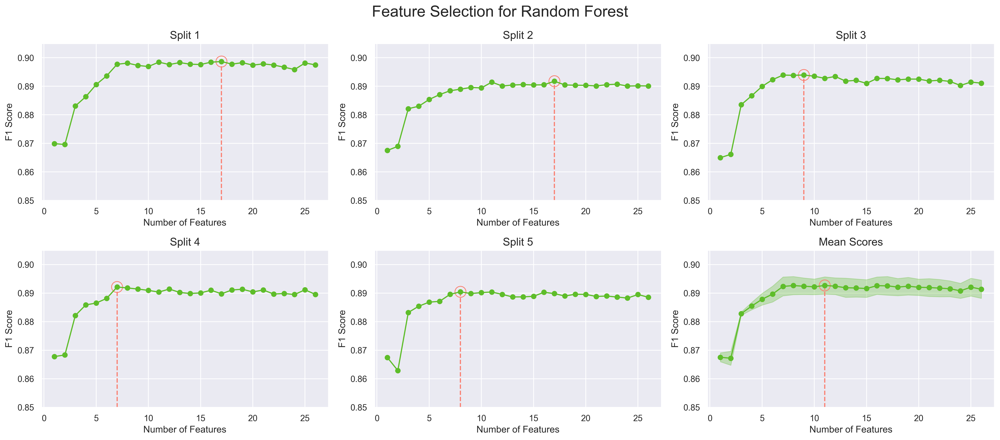

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.85, 0.905], colors=colors)

#### On normalized data

In [18]:
%%time
save_path = f'PlantsData/RandomForest/Normalized'

# Search best configurations
rf_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 13
 > F1 Score: 0.898705636743215
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8918318523581681
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8942084942084942
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8920998632010945
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 500}

Split 5:
=== Best Results ===============================================================

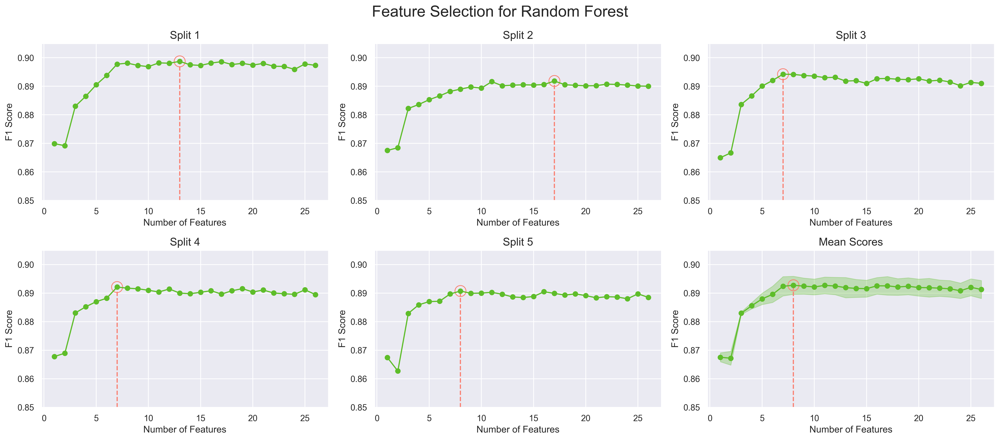

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest/Normalized'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", colors=colors, y_lims=[0.85, 0.905])

### Non-Normalized vs Normalized data

,n_features,criterion,n_estimators,test_score,fit_time,score_time,n_features (n),criterion (n),n_estimators (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,,,,,
Split 1,17,gini,1000,0.898648,44.674198,1.463998,13,gini,1000,0.898706,38.385405,1.463000
Split 2,17,gini,1000,0.891756,45.340261,1.526457,17,gini,1000,0.891832,42.273631,1.432467
Split 3,9,gini,1000,0.893928,41.904194,1.344935,7,entropy,1000,0.894208,35.530221,1.342533
Split 4,7,entropy,1000,0.892118,35.752045,1.329327,7,entropy,500,0.892100,17.824143,0.674000
Split 5,8,entropy,500,0.890431,17.646645,0.687128,8,entropy,500,0.890712,18.927598,0.704808


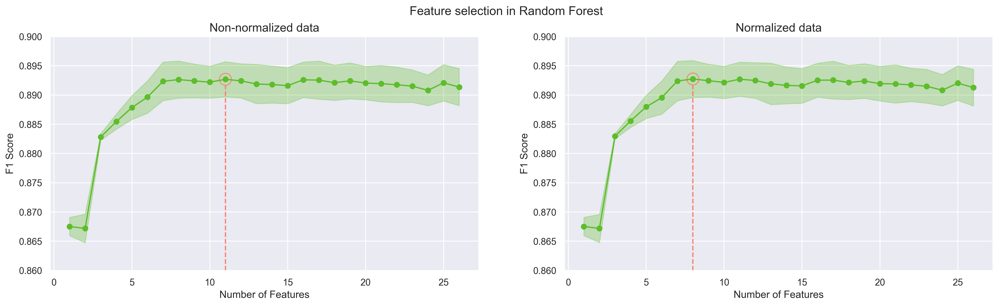

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest'
colors = ['#5EBD2A', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Random Forest")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[0.86, 0.9], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[0.86, 0.9], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

Although is repeated the 1000 estimators, we may actually need fewer, so we will try more possibilities.

---
## 1.2. Features and hyperparameters selection (more estimators)

In [37]:
from sklearn.ensemble import RandomForestClassifier

# Classifier
estimator = RandomForestClassifier(random_state = SEED)

# Hyperparameters to evaluate
params_grid = {'n_estimators': [100, 200, 400, 600, 800, 1000],
               'criterion'   : ['gini', 'entropy']
              }
# Colors to classifier results
colors = ['#5EBD2A', 'salmon']

#### Non-normalized data

In [38]:
%%time
save_path = f'PlantsData/RandomForest_V2'

# Search best configurations
rf_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8987394607229318
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 800}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8917556599743699
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8944792650467932
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 800}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 8
 > F1 Score: 0.8923391912642893
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 800}

Split 5:
=== Best Results ================================================================

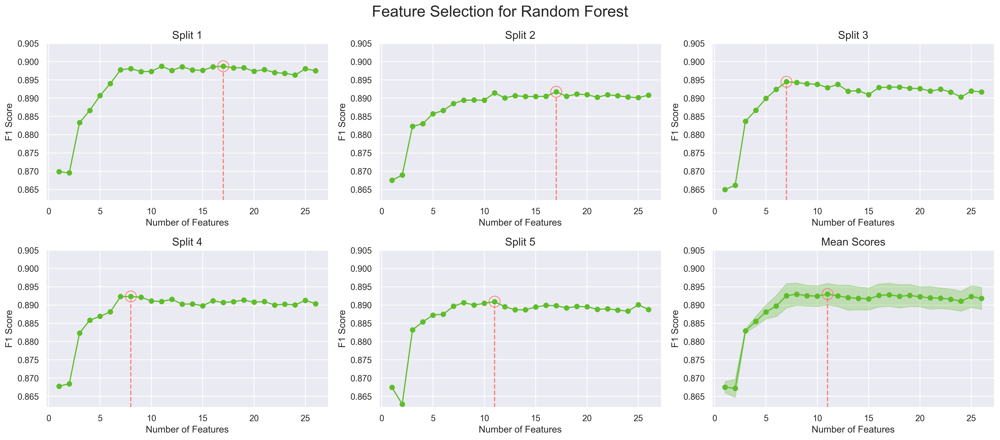

In [122]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest_V2'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.862, 0.905], colors=colors)

#### On Normalized data

In [41]:
%%time
save_path = f'PlantsData/RandomForest_V2/Normalized'

# Search best configurations
rf_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8987563642433855
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 800}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.8918318523581681
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 8
 > F1 Score: 0.8944525422275572
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 200}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8924418604651163
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 600}

Split 5:
=== Best Results ================================================================

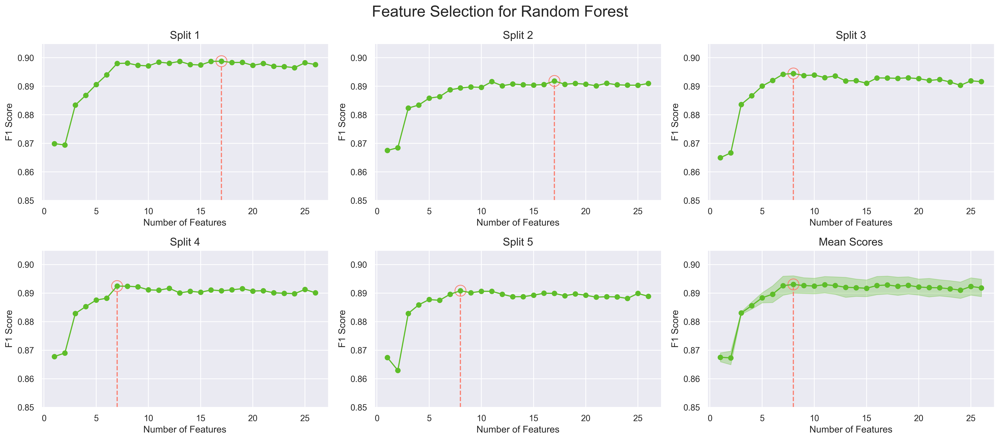

In [124]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest_V2/Normalized'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.85, 0.905], colors=colors)

### Non-Normalized vs Normalized data

,n_features,criterion,n_estimators,test_score,fit_time,score_time,n_features (n),criterion (n),n_estimators (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,,,,,
Split 1,17,gini,800,0.898739,39.540026,1.196000,17,gini,800,0.898756,37.899560,1.168141
Split 2,17,gini,1000,0.891756,46.767319,1.448517,17,gini,1000,0.891832,46.841408,1.427000
Split 3,7,entropy,800,0.894479,32.781301,1.088000,8,entropy,200,0.894453,9.387719,0.330636
Split 4,8,entropy,800,0.892339,32.325847,1.103162,7,entropy,600,0.892442,24.918635,0.829129
Split 5,11,gini,400,0.890923,19.888468,0.634413,8,entropy,600,0.890825,24.708237,0.934221


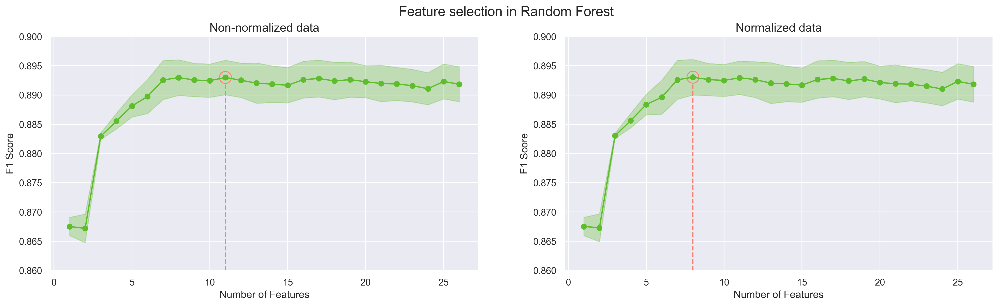

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/RandomForest_V2'

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Random Forest", fontsize=16)
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[0.86, 0.9], colors=['#5EBD2A', 'salmon'])
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[0.86, 0.9], colors=['#5EBD2A', 'salmon'])

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]
compare_Results = pd.concat([results, std_results], axis=1)

compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color='#5EBD2A', axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color='#5EBD2A', axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color='salmon', axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color='salmon', axis=0)

The best number of features on non-normalized data is 11, and in normalized data is 8.

For a better decision about parameters, the performance in each number of estimators is graphed below.

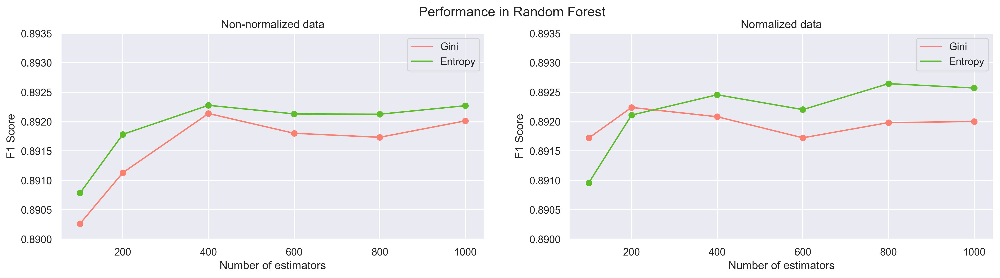

In [63]:
# Compare number of estimators in best number of features
n_features = [11, 8]
save_path = f'PlantsData/RandomForest_V2'
colors = ['#5EBD2A', 'salmon']

scores_gini, scores_gini_std = [], []
scores_entropy, scores_entropy_std = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features[0]}_features.csv")
    df_std = pd.read_csv(f"{save_path}/Normalized/split_{i}/{n_features[1]}_features.csv")
    
    scores_gini.append(df[df['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy.append(df[df['param_criterion'] == 'entropy']['mean_test_score'])

    scores_gini_std.append(df_std[df_std['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy_std.append(df_std[df_std['param_criterion'] == 'entropy']['mean_test_score'])

    n_estimators = df[df['param_criterion'] == 'gini']['param_n_estimators']

# Plot the comparation
scores = [[scores_gini, scores_entropy], [scores_gini_std, scores_entropy_std]]
fig, ax = plt.subplots(1, 2, figsize=(18,4), dpi=300)
fig.suptitle("Performance in Random Forest")
for i in range(2):
    ax[i].set_title("Non-normalized data" if i == 0 else "Normalized data")
    ax[i].plot(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1], label="Gini")
    ax[i].scatter(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1])
    ax[i].plot(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0], label="Entropy")
    ax[i].scatter(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0])
    ax[i].set_ylabel("F1 Score")
    ax[i].set_xlabel("Number of estimators")
    ax[i].set_ylim([0.89, 0.8935])
    ax[i].legend()

The best results in both are with entropy criterion, but normalized data is getting a better performance, especially with 800 estimators.

## 1.3. Evaluation in test data

We will evaluate on the normalized data.

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Random Forest (1000 estimators),0.890717,0.850850,0.927869,0.887692,43.752968,1.834999
Random Forest (800 estimators),0.891115,0.851334,0.928154,0.888086,34.897276,1.480000
Random Forest (600 estimators),0.890518,0.851250,0.926728,0.887387,26.405833,1.131686


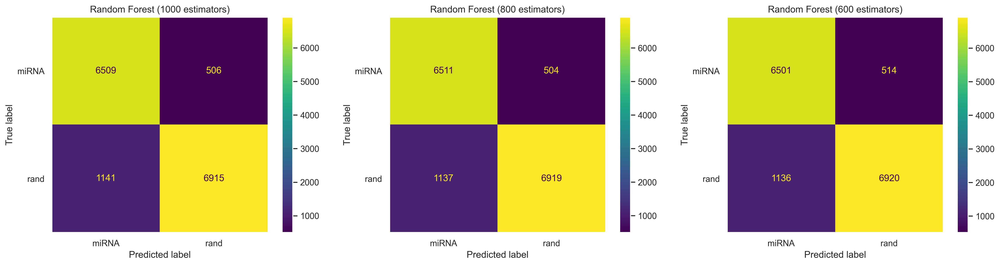

In [153]:
from sklearn.ensemble import RandomForestClassifier

save_path = f'PlantsData/RandomForest/split_0'
colors = ['#5EBD2A', 'salmon']

# Best classifiers
n_features = 8

best_estimators = [0]*3
best_estimators[0] = RandomForestClassifier(n_estimators=1000, criterion='entropy', random_state = SEED)
best_estimators[1] = RandomForestClassifier(n_estimators=800, criterion='entropy', random_state = SEED)
best_estimators[2] = RandomForestClassifier(n_estimators=600, criterion='entropy', random_state = SEED)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["Random Forest (1000 estimators)", "Random Forest (800 estimators)", "Random Forest (600 estimators)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(22,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

As we expected the 800 estimators is the ideal for better results.

---
# 2. Support Vector Machines

### 2.1. Features and hyperparameters selection

In [29]:
from sklearn.svm import SVC

# Classifier
estimator = SVC(random_state=SEED)

# Hyperparameters to evaluate
params_grid = {'C'      : [1, 10, 100],
               'gamma'  : [0.01, 0.1, 1],
               'kernel' : ['linear', 'rbf']
              }
# Colors to classifier results
colors = ['#F3A230', 'salmon']

In [30]:
%%time
save_path = f'PlantsData/SVM'

# Search best configurations
svm_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
svm_splits_results = save_splits_results(svm_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 13
 > F1 Score: 0.8988896366083445
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 8
 > F1 Score: 0.8924241121334594
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.8950333708936467
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 11
 > F1 Score: 0.8938884578915611
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 5:
=== Best Results ==================================================================================

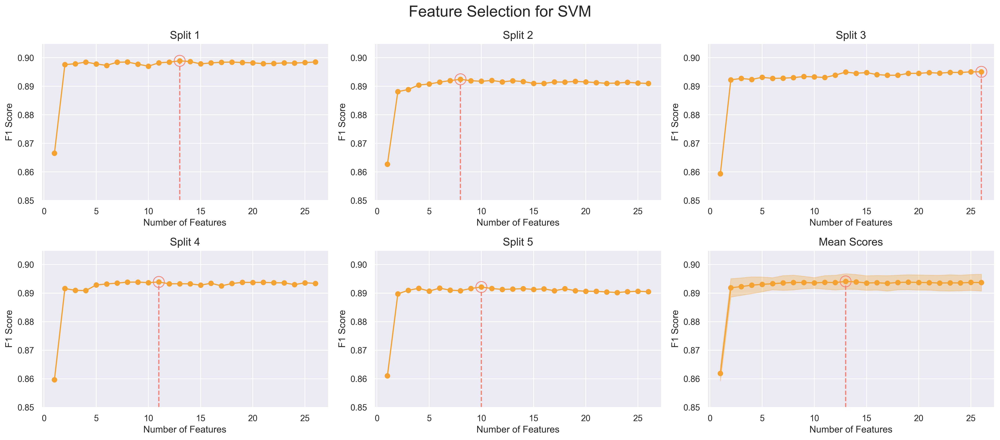

In [151]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/SVM'
svm_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(svm_splits_results, "SVM", y_lims=[0.85, 0.905], colors=colors)

Every split have very diferent results, but the average curve can give us a razonable value with 13 features.

### Selection results summary

,n_features,C,gamma,kernel,test_score,fit_time,score_time
data,,,,,,,
Split 1,13,100,1.000000,rbf,0.898890,45.429026,7.664354
Split 2,8,100,1.000000,rbf,0.892424,31.274992,7.036155
Split 3,26,100,1.000000,rbf,0.895033,97.469043,8.811065
Split 4,11,100,1.000000,rbf,0.893888,40.222169,7.504938
Split 5,10,100,1.000000,rbf,0.892113,36.779486,7.311416


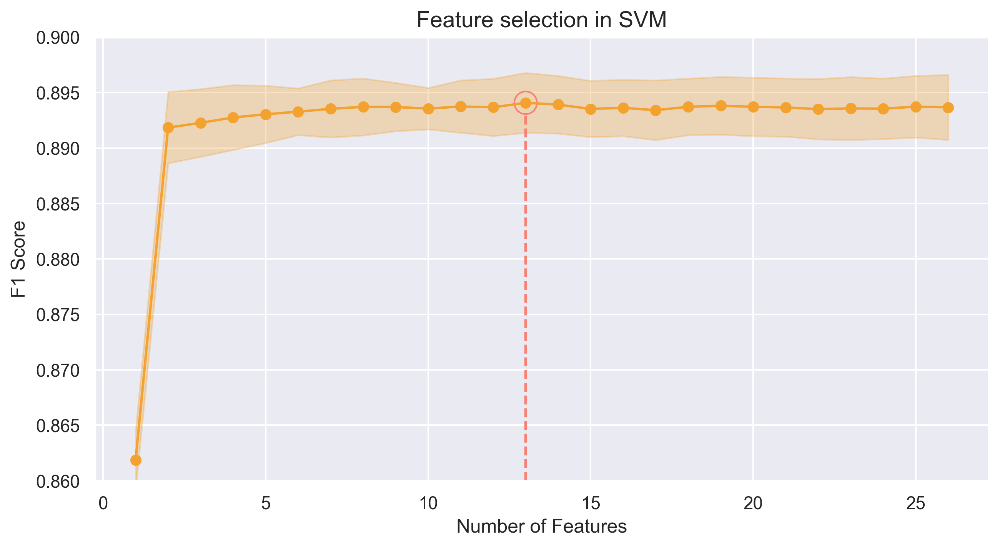

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/SVM'
colors = ['#F3A230', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in SVM", std=True, y_lims=[0.86, 0.9], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

The best result is clear, RBF kernel is better with C = 100 and gamma = 1.

## 2.3. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
SVM RBF,0.893371,0.859574,0.921454,0.889439,51.916505,12.237552


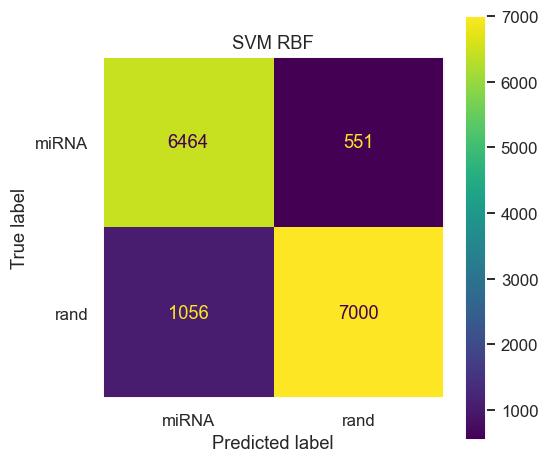

In [154]:
from sklearn.svm import SVC

save_path = f'PlantsData/SVM/split_0'
colors = ['#F3A230', 'salmon']

# Best classifier
n_features = 13
best_estimator = SVC(
                     C            = 100,
                     gamma        = 1.0,
                     kernel       = 'rbf',
                     random_state = SEED
                    )

# Evaluate the best classifier
report, conf_matrix, _ = estimator_evaluation(
                            estimator  = best_estimator, 
                            train_data = [X_train_val_std, y_train_val], 
                            test_data  = [X_test_std, y_test],
                            n_features = n_features,
                            save_path  = save_path,
                            model_name = "SVM RBF"
                        )
# Plot confusion matrix
fig, ax = plt.subplots(figsize=(5,5), dpi=110)
ax.set_title("SVM RBF")
conf_matrix.plot(ax=ax)
ax.grid(False)

report.style.highlight_max(color=colors[0], axis=1)

The train time is high, but have good results.

---
# 3. Neural Networks

### 3.1. Features and hyperparameters selection

In [20]:
from sklearn.neural_network import MLPClassifier

# Classifier
estimator = MLPClassifier(early_stopping=True, random_state=SEED)

# Hyperparameters to evaluate
params_grid = { 'hidden_layer_sizes' : [(10), (20), (10, 10), (20, 20)],
                'learning_rate_init' : [0.001, 0.01, 0.1],
                'solver'             : ['sgd', 'adam']
              }

In [21]:
%%time
save_path = f'PlantsData/MLP'

# Search best configurations
mlp_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
mlp_splits_results = save_splits_results(mlp_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 16
 > F1 Score: 0.9013271783035198
 > Hyperparameters: {'hidden_layer_sizes': 10, 'learning_rate_init': 0.1, 'solver': 'adam'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 25
 > F1 Score: 0.8932335940156408
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_rate_init': 0.001, 'solver': 'adam'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 9
 > F1 Score: 0.8956234656734107
 > Hyperparameters: {'hidden_layer_sizes': 20, 'learning_rate_init': 0.01, 'solver': 'adam'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 22
 > F1 Score: 0.8959199253541438
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_r

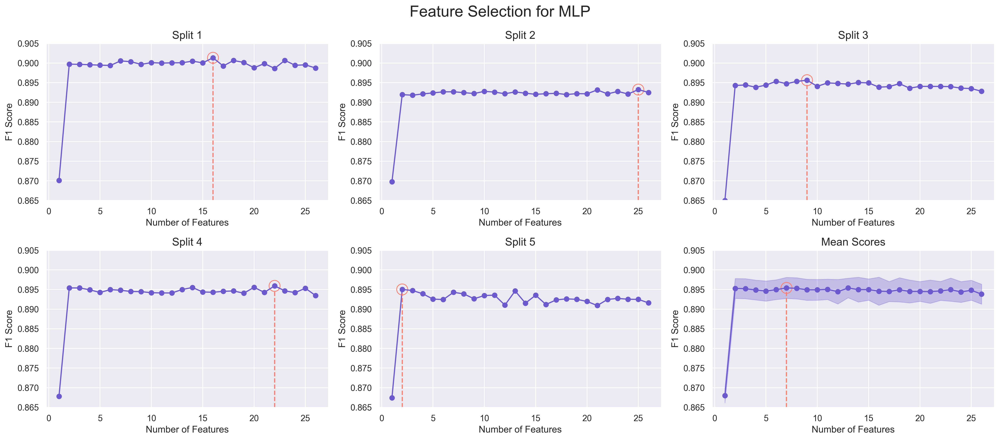

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/MLP'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "MLP", y_lims=[0.865, 0.905])

### Selection results summary

,n_features,hidden_layer_sizes,learning_rate_init,solver,test_score,fit_time,score_time
data,,,,,,,
Split 1,16,10,0.100000,adam,0.901327,2.743212,0.007003
Split 2,25,"(20, 20)",0.001000,adam,0.893234,7.039011,0.005988
Split 3,9,20,0.010000,adam,0.895623,2.841828,0.006004
Split 4,22,"(20, 20)",0.001000,adam,0.895920,6.396258,0.006000
Split 5,2,"(10, 10)",0.100000,adam,0.895014,2.826808,0.007000


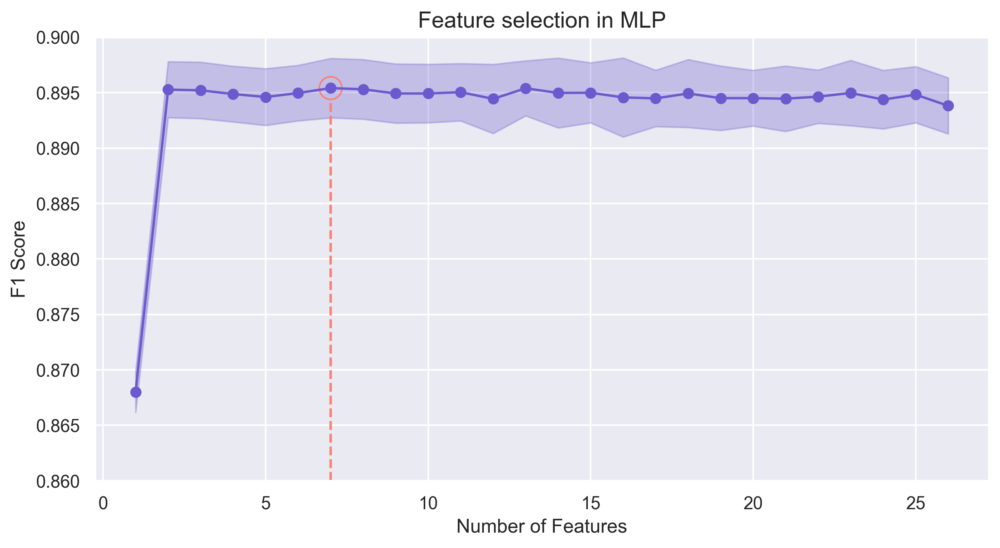

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/MLP'

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in MLP", std=True, y_lims=[0.86, 0.9])

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path)

The best result in average curve is with 7 features, but the results are very different in each split, so to be sure it may be better to evaluate with 7 and 13 features, because it seems that the result is very close.

## 3.2. Evaluation in test data

Evaluation with 7 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
MLP (10 neurons),0.887333,0.828656,0.955524,0.887579,1.367991,0.002001
"MLP (20, 20 neurons)",0.892376,0.847174,0.937990,0.890272,3.471943,0.003999


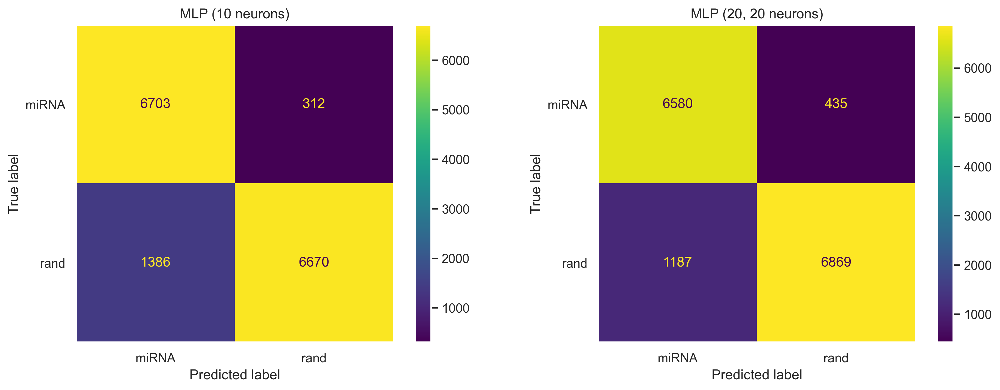

In [158]:
from sklearn.neural_network import MLPClassifier

save_path = f'PlantsData/MLP/split_0'
 
# Best classifiers
n_features = 7

best_estimators = [0]*2
best_estimators[0] = MLPClassifier(
                                hidden_layer_sizes = (10),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimators[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.001,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["MLP (10 neurons)", "MLP (20, 20 neurons)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color='slateblue', axis=0)

Evaluation with 13 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
MLP (10 neurons),0.891779,0.864671,0.909907,0.886713,1.125560,0.003000
"MLP (20, 20 neurons)",0.892442,0.856840,0.923165,0.888767,4.315000,0.004001


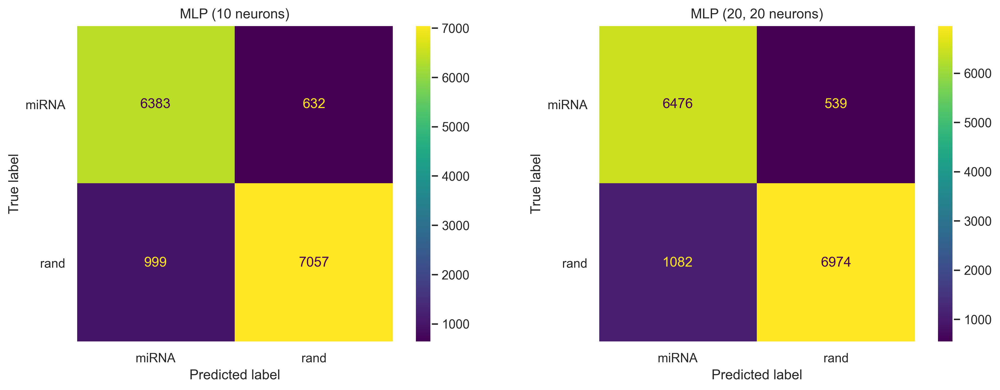

In [47]:
from sklearn.neural_network import MLPClassifier

save_path = f'PlantsData/MLP/split_0'
 
# Best classifiers
n_features = 13

best_estimators = [0]*2
best_estimators[0] = MLPClassifier(
                                hidden_layer_sizes = (10),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimators[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.001,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["MLP (10 neurons)", "MLP (20, 20 neurons)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color='slateblue', axis=0)

Finally, the best results are with 7 features how predicted the average curve.

---
# 4. K-Nearest Neighbors

### 4.1. Features and hyperparameters selection

In [16]:
from sklearn.neighbors import KNeighborsClassifier

# Classifier
estimator = KNeighborsClassifier()

# Hyperparameters to evaluate
params_grid = {'n_neighbors' : [5, 10, 15, 20, 25, 30],
               'p': [1, 2]}  # Manhattan and euclidean distance metrics

# Colors to classifier results
colors = ['lightseagreen', 'salmon']

Some parameter settings result in division by zero when calculating F1 Score, this is because the recall and precision of the classifier with these settings is really bad, in fact both are zero, and this means that TP = 0, so the classifier is useless because cannot predict any correct positive result. So we ignore invalid result warnings, because this results will be discarded anyway.

In [17]:
%%time
import warnings

save_path = f'PlantsData/KNN'

# Search best configurations
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    knn_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
    knn_splits_results = save_splits_results(knn_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8984296692281991
 > Hyperparameters: {'n_neighbors': 25, 'p': 1}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.8892866274610074
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8926456706427529
 > Hyperparameters: {'n_neighbors': 25, 'p': 1}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8917490623934539
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.890791928099033

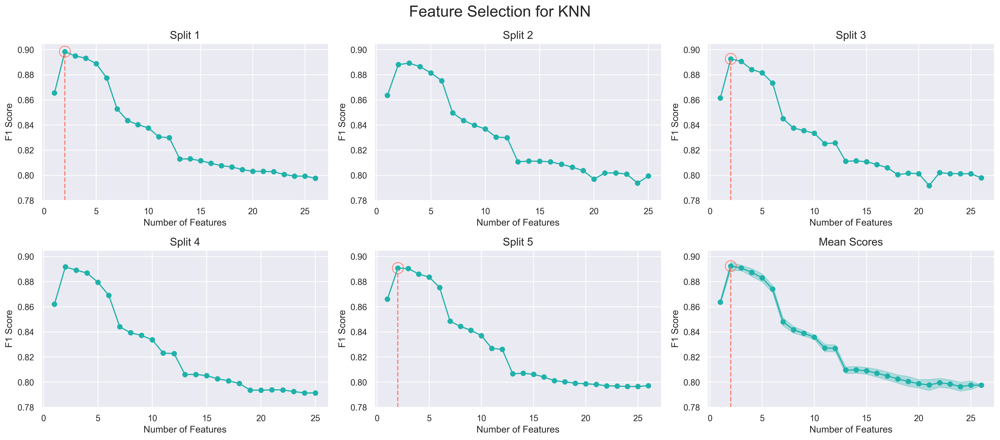

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/KNN'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "KNN", y_lims=[0.78, 0.905], colors=colors)

### Selection results summary

,n_features,n_neighbors,p,test_score,fit_time,score_time
data,,,,,,
Split 1,2,25,1,0.898430,0.029834,0.419540
Split 2,3,25,2,0.889287,0.053644,0.318144
Split 3,2,25,1,0.892646,0.059809,0.322806
Split 4,2,25,2,0.891749,0.060000,0.279999
Split 5,2,25,2,0.890792,0.060038,0.296602


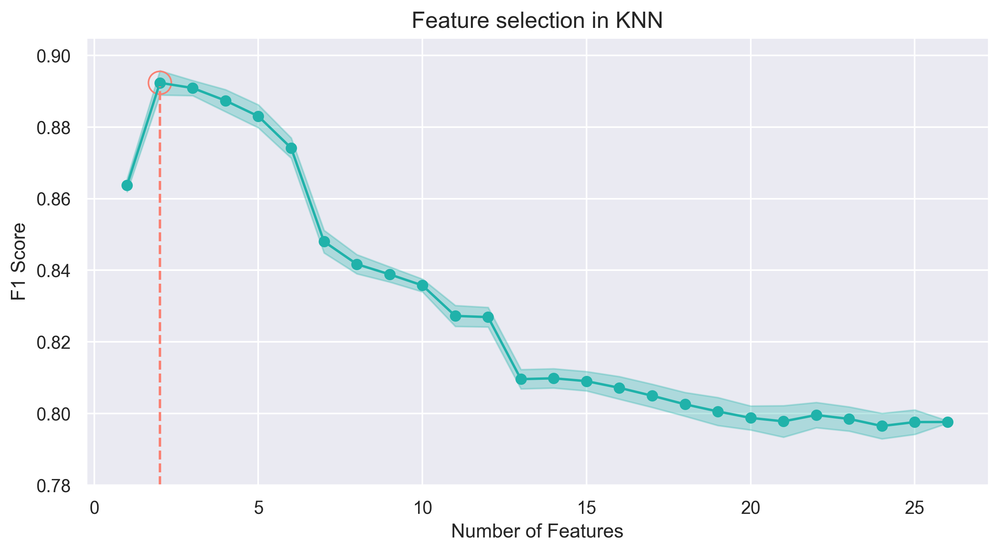

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/KNN'
colors = ['lightseagreen', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in KNN", std=True, y_lims=[0.78, 0.905], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

The algorithm have bad results with more than 5 features, and is clearly better with 2 features. 
For a better decision, the performance in each number of neighbors by distance metric with 2 and 5 features is graphed below.

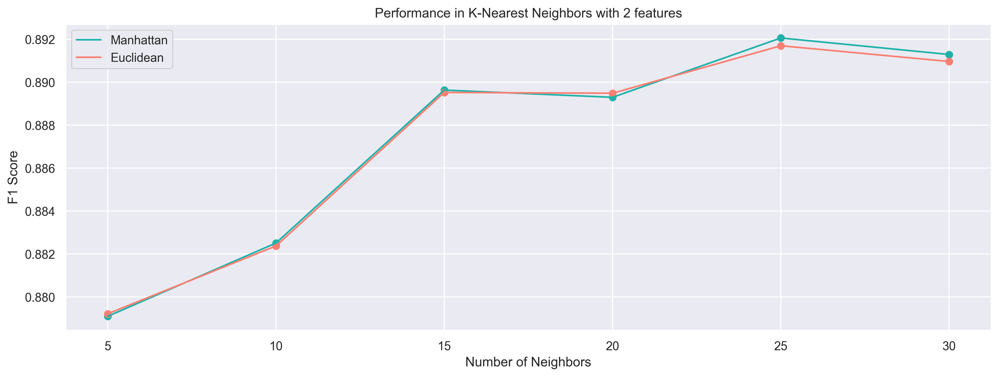

In [39]:
# Compare number of neighbors in best number of features
n_features = 2
save_path = f'PlantsData/KNN'
colors = ['lightseagreen', 'salmon']

scores_1, scores_2 = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features}_features.csv")
    scores_1.append(df[df['param_p'] == 1]['mean_test_score'])
    scores_2.append(df[df['param_p'] == 2]['mean_test_score'])
    n_neighbors = df[df['param_p'] == 1]['param_n_neighbors']

# Plot the comparation
fig, ax = plt.subplots(figsize=(15,5), dpi=300)
ax.set_title("Performance in K-Nearest Neighbors with 2 features")
ax.plot(n_neighbors, np.mean(scores_1, axis=0), color=colors[0], label="Manhattan")
ax.scatter(n_neighbors, np.mean(scores_1, axis=0), color=colors[0])
ax.plot(n_neighbors, np.mean(scores_2, axis=0), color=colors[1], label="Euclidean")
ax.scatter(n_neighbors, np.mean(scores_2, axis=0), color=colors[1])
ax.set_ylabel("F1 Score")
ax.set_xlabel("Number of Neighbors")
ax.legend()

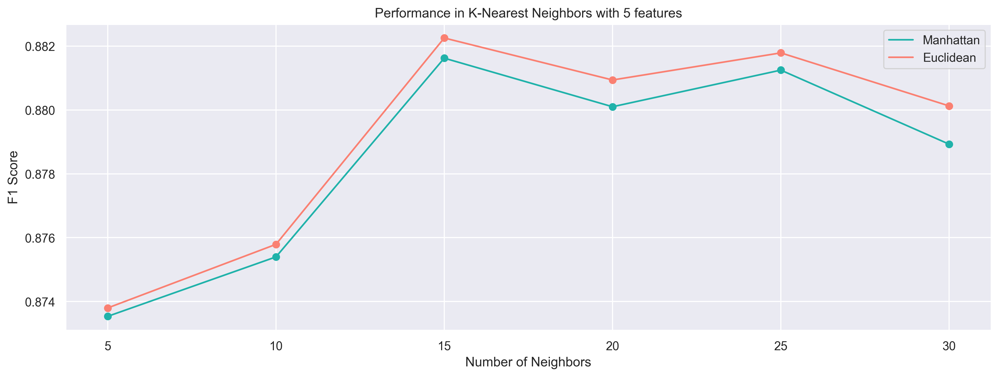

In [40]:
# Compare number of neighbors in best number of features
n_features = 5
save_path = f'PlantsData/KNN'
colors = ['lightseagreen', 'salmon']

scores_1, scores_2 = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features}_features.csv")
    scores_1.append(df[df['param_p'] == 1]['mean_test_score'])
    scores_2.append(df[df['param_p'] == 2]['mean_test_score'])
    n_neighbors = df[df['param_p'] == 1]['param_n_neighbors']

# Plot the comparation
fig, ax = plt.subplots(figsize=(15,5), dpi=300)
ax.set_title("Performance in K-Nearest Neighbors with 5 features")
ax.plot(n_neighbors, np.mean(scores_1, axis=0), color=colors[0], label="Manhattan")
ax.scatter(n_neighbors, np.mean(scores_1, axis=0), color=colors[0])
ax.plot(n_neighbors, np.mean(scores_2, axis=0), color=colors[1], label="Euclidean")
ax.scatter(n_neighbors, np.mean(scores_2, axis=0), color=colors[1])
ax.set_ylabel("F1 Score")
ax.set_xlabel("Number of Neighbors")
ax.legend()

With 2 features the two distance metrics are very close, but we can say that the best results are with 25 neighbors how we can see before. In the other case, the euclidean metric is better always, and 15 neighbors is the best option. For be sure, we will go to evaluate this options with test data.

## 4.2. Evaluation in test data

Evaluation with 2 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
KNN (Manhattan distance),0.888859,0.847837,0.927726,0.885985,0.037002,0.243998
KNN (Euclidean distance),0.888395,0.847155,0.927584,0.885547,0.037000,0.245000


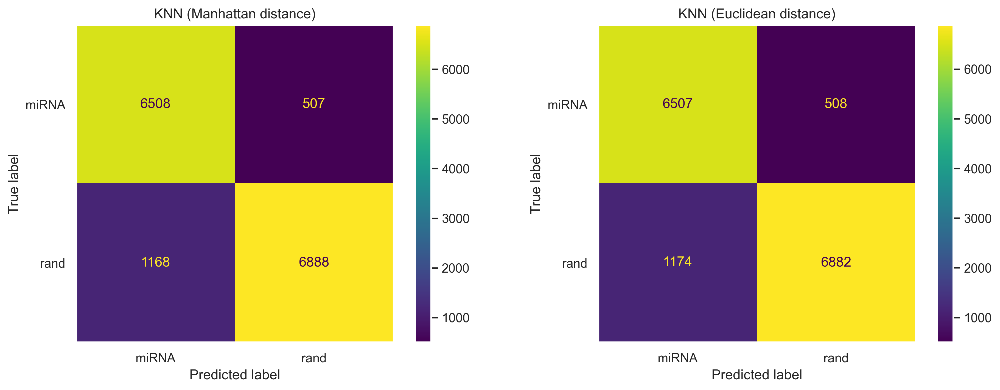

In [109]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

save_path = f'PlantsData/KNN/split_0'
colors = ['lightseagreen', 'salmon']

# Best classifiers
n_features = 2

best_estimators = [0]*2
best_estimators[0] = KNeighborsClassifier(n_neighbors=25, p=1)
best_estimators[1] = KNeighborsClassifier(n_neighbors=25, p=2)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["KNN (Manhattan distance)", "KNN (Euclidean distance)"]

# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(len(best_estimators)):
        report[i], conf_matrix[i], _ = estimator_evaluation(
                                        estimator  = best_estimators[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features,
                                        save_path  = save_path,
                                        model_name = model_names[i]
                                    )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

Evaluation with 5 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
KNN (Manhattan distance),0.881760,0.844684,0.914041,0.877995,0.027048,0.511996
KNN (Euclidean distance),0.880565,0.841878,0.915324,0.877066,0.022553,0.431317


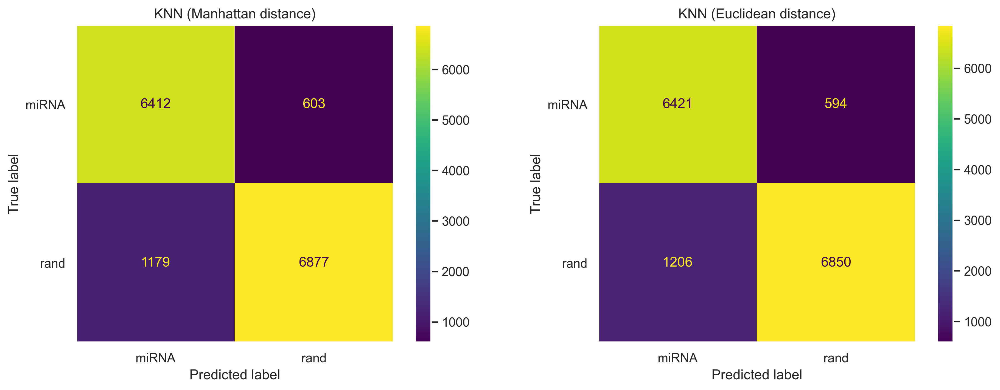

In [59]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

save_path = f'PlantsData/KNN/split_0'
colors = ['lightseagreen', 'salmon']

# Best classifiers
n_features = 5

best_estimators = [0]*2
best_estimators[0] = KNeighborsClassifier(n_neighbors=25, p=1)
best_estimators[1] = KNeighborsClassifier(n_neighbors=25, p=2)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["KNN (Manhattan distance)", "KNN (Euclidean distance)"]

# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(len(best_estimators)):
        report[i], conf_matrix[i], _ = estimator_evaluation(
                                        estimator  = best_estimators[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features,
                                        save_path  = save_path,
                                        model_name = model_names[i]
                                    )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

Finally is better consider 2 features with 25 neighbors and manhattan distance, how the method predicted.

---
# 5. Naive Bayes

## 5.1. Features and hyperparameters selection

In [27]:
from sklearn.naive_bayes import MultinomialNB

# Classifier
estimator = MultinomialNB()

# Hyperparameters to evaluate
params_grid = {}

# Colors to classifier results
colors = ['#5065DE', 'salmon']

#### Non-normalized data

In [28]:
%%time
save_path = f'PlantsData/NaiveBayes'

# Search best configurations
nb_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
nb_splits_results = save_splits_results(nb_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8562732499154548
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.8516635447328517
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8520545565111631
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 25
 > F1 Score: 0.8527296937416776
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8507462686567163
 > Hyperparameters: {}
CPU times: total: 26.5 s
Wall time: 46.7 s


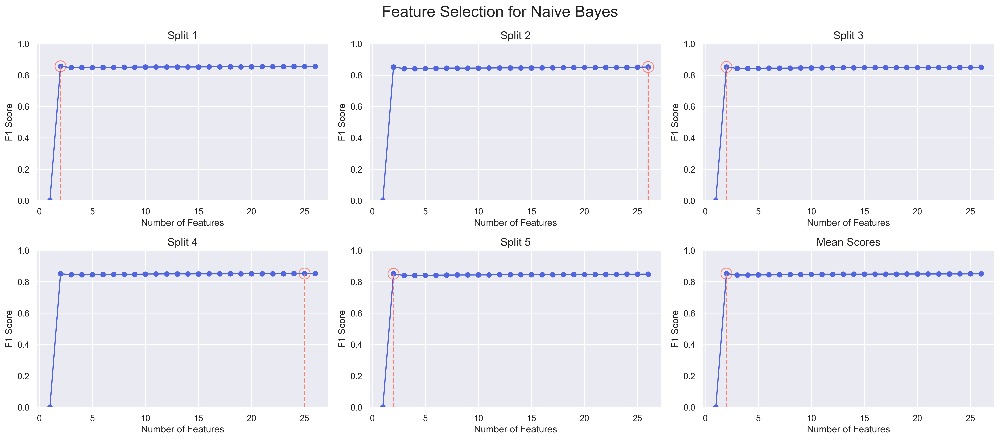

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/NaiveBayes'
nb_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_splits_results, "Naive Bayes", colors=colors)

#### On Normalized data

In [31]:
%%time
save_path = f'PlantsData/NaiveBayes/Normalized'

# Search best configurations
nb_std_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
nb_std_splits_results = save_splits_results(nb_std_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 22
 > F1 Score: 0.609703735508802
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.6229122055674519
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 23
 > F1 Score: 0.6269491343155178
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 25
 > F1 Score: 0.6117494038586604
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 15
 > F1 Score: 0.6092500540306894
 > Hyperparameters: {}
CPU times: total: 27.3 s
Wall time: 41.2 s


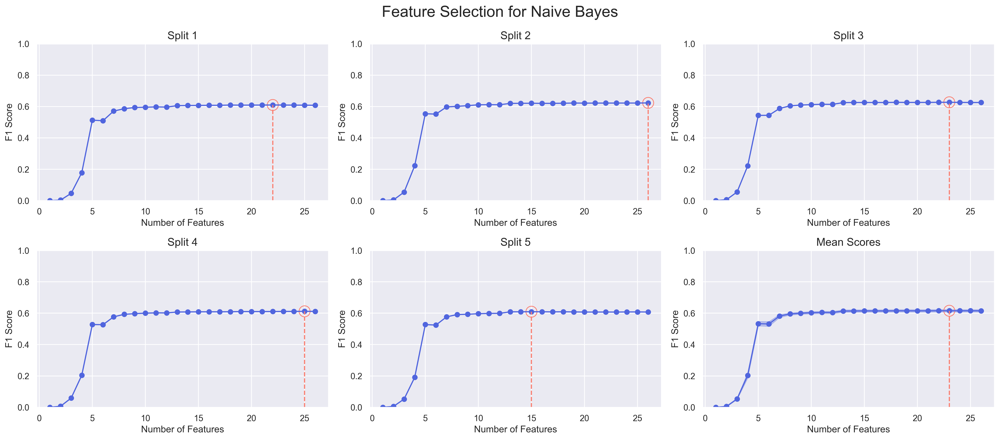

In [163]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/NaiveBayes/Normalized'
nb_std_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_std_splits_results, "Naive Bayes", colors=colors)

### Non-Normalized vs Normalized data

,n_features,test_score,fit_time,score_time,n_features (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,
Split 1,2,0.856273,0.004999,0.002999,22,0.609704,0.010998,0.003000
Split 2,26,0.851664,0.013148,0.003000,26,0.622912,0.011998,0.003000
Split 3,2,0.852055,0.005000,0.003000,23,0.626949,0.011155,0.003000
Split 4,25,0.852730,0.012000,0.003000,25,0.611749,0.012000,0.003000
Split 5,2,0.850746,0.005003,0.002996,15,0.609250,0.009000,0.003001


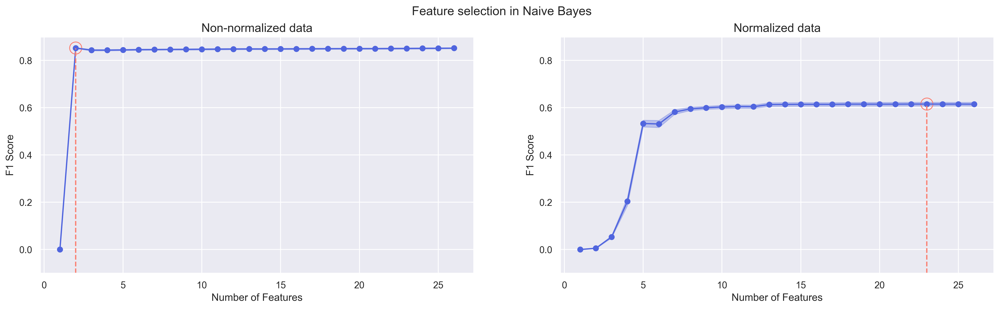

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'PlantsData/NaiveBayes'
colors = ['#5065DE', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Naive Bayes")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[-0.1, 0.9], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[-0.1, 0.9], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

The non-normalized data has better results but does not seem to be a reliable result, considering the scale of the data.

## 5.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Naive Bayes (Non-normalized data),0.854887,0.822038,0.878403,0.849287,0.011103,0.001239
Naive Bayes (Normalized data),0.704134,0.784886,0.501924,0.612295,0.150615,0.007009


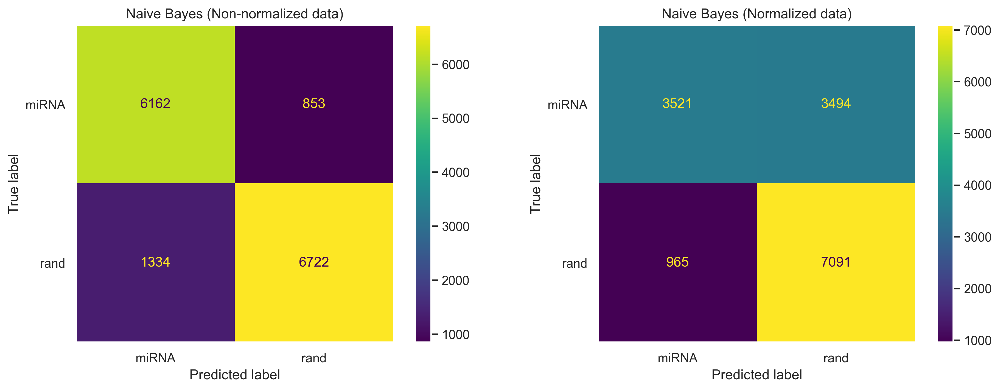

In [64]:
from sklearn.naive_bayes import MultinomialNB

save_path = f'PlantsData/NaiveBayes/split_0'
colors = ['#5065DE', 'salmon']

# Best classifier
n_features = [2, 16]
best_estimator = MultinomialNB()

report, conf_matrix = [0]*2, [0]*2
# Evaluate on no normalized data
report[0], conf_matrix[0], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val, y_train_val], 
                                test_data  = [X_test, y_test],
                                n_features = n_features[0],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Non-normalized data)"
                            )
# Evaluate on normalized data
report[1], conf_matrix[1], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[1],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Normalized data)"
                            )
# Plot confusion matrix
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=300)
ax[0].set_title("Naive Bayes (Non-normalized data)")
ax[1].set_title("Naive Bayes (Normalized data)")
conf_matrix[0].plot(ax=ax[0])
conf_matrix[1].plot(ax=ax[1])
ax[0].grid(False)
ax[1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)

---
---
# Classifiers Comparation Results

### Feature selection plots

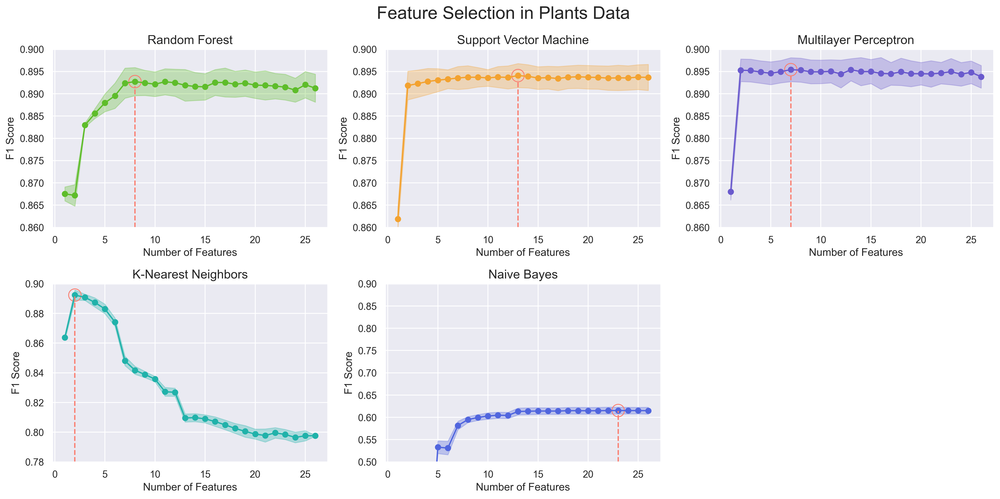

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set(color_codes=True)

model_files = ['RandomForest/Normalized', 'SVM', 'MLP', 'KNN', 'NaiveBayes/Normalized']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

colors = ['#5EBD2A', '#F3A230', 'slateblue', 'lightseagreen', '#5065DE']
y_lims = [[0.86, 0.9]]*3+[[0.78, 0.9]]+[[0.5, 0.9]]

fig, ax = plt.subplots(2, 3, figsize=(16, 8), dpi=300)
fig.suptitle(f"Feature Selection in Plants Data", fontsize= 20)
for i in range(len(model_files)):
    model_results = pd.read_csv(f'PlantsData/{model_files[i]}/splits_results_summary.csv')
    model_results = model_results[['n_features', 'mean_scores', 'std_scores']]
    model_results.columns = ['n_features', 'score', 'std_scores']
    axes = [0,i] if i < 3 else [1, i-3]
    plot_rfeh_results(model_results, ax[axes[0], axes[1]], f"{model_names[i]}", 
                      std=True, colors=[colors[i], 'salmon'], y_lims=y_lims[i])
    fig.tight_layout()
ax[-1, -1].set_visible(False)

### Evaluation in test data

In [115]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC

save_path = "PlantsData"
model_files = ['RandomForest', 'SVM', 'MLP', 'KNN', 'NaiveBayes']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

n_features, best_estimator = [0]*5, [0]*5
report, conf_matrix, y_preds = [0]*5, [0]*5, [0]*5

# Best hyperparameters ------------------------------------------------------------------
params_list = ['n_estimators: 800, criterion: entropy',
               'kernel: rbf, C: 100, gamma: 1',
               'hidden_layer_sizes = (20, 20), learning_rate_init: 0.001, solver: adam',
               'n_neighbors: 25, p: 1',
               '---'
               ]
# Best classifiers ----------------------------------------------------------------------
n_features[0] = 8
best_estimator[0] = RandomForestClassifier(
                                        n_estimators=800, 
                                        criterion='entropy', 
                                        random_state = SEED
                                        )
n_features[1] = 13
best_estimator[1] = SVC(
                     C            = 100,
                     gamma        = 1.0,
                     kernel       = 'rbf',
                     random_state = SEED
                    )
n_features[2] = 7
best_estimator[2] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.001,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
n_features[3] = 2
best_estimator[3] = KNeighborsClassifier(n_neighbors = 25, p = 1)

n_features[4] = 23
best_estimator[4] = MultinomialNB()

,Parameters,No.Features,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Random Forest (Plants Data),"n_estimators: 800, criterion: entropy",8,0.891115,0.851334,0.928154,0.888086,34.223192,1.437471
Support Vector Machine (Plants Data),"kernel: rbf, C: 100, gamma: 1",13,0.893371,0.859574,0.921454,0.889439,48.773195,11.848759
Multilayer Perceptron (Plants Data),"hidden_layer_sizes = (20, 20), learning_rate_init: 0.001, solver: adam",7,0.892376,0.847174,0.937990,0.890272,3.476151,0.004001
K-Nearest Neighbors (Plants Data),"n_neighbors: 25, p: 1",2,0.888859,0.847837,0.927726,0.885985,0.044997,0.242162
Naive Bayes (Plants Data),---,23,0.703138,0.781895,0.502352,0.611699,0.031629,0.008109


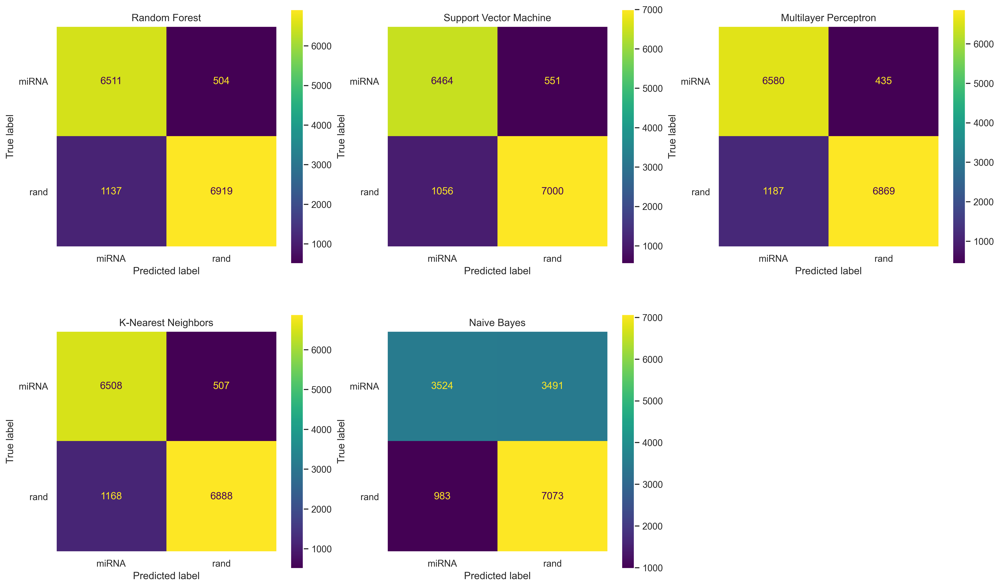

In [116]:
# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(5):
        report[i], conf_matrix[i], y_preds[i] = estimator_evaluation(
                                        estimator  = best_estimator[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features[i],
                                        save_path  = f"{save_path}/{model_files[i]}/split_0",
                                        model_name = model_names[i]+' (Plants Data)'
                                    )
predict_df = pd.DataFrame(data=np.array(y_preds).T,columns=model_names)
predict_df.to_csv(f"{save_path}/predictions.csv")

# Summary results
fig, ax = plt.subplots(2, 3, figsize=(20,12), dpi=300)
results_summary = pd.DataFrame()
row = 0
for i in range(5):
    if i == 3: row = 1
    ax[row, i - row*3].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[row, i- row*3])
    ax[row, i - row*3].grid(False)
    results_summary = pd.concat([results_summary, report[i]], axis=0)

ax[-1, -1].axis('off')

# Add parameters in results
results_summary.insert(0, 'Parameters', params_list)
results_summary.insert(1, 'No.Features', n_features)
results_summary.to_csv(f"{save_path}/results_summary.csv")
results_summary.style.highlight_max(color='salmon', subset=results_summary.columns[2:])\
                     .highlight_min(color='slateblue', subset=results_summary.columns[2:])

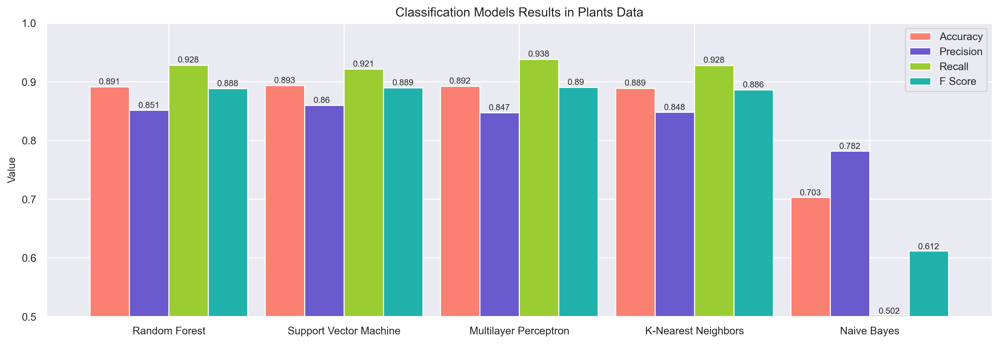

In [130]:
# Plot metrics results
results_summary = pd.read_csv("PlantsData/results_summary.csv")

colors = ['salmon', 'slateblue', 'yellowgreen', 'lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(Accuracy|Precision|Recall|F1 Score)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Results in Plants Data', fontsize=12)
ax.legend(['Accuracy', 'Precision', 'Recall', 'F Score'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Value', fontsize=10)
ax.set_ylim(0.5, 1)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.05, p.get_height() * 1.005), fontsize=8)

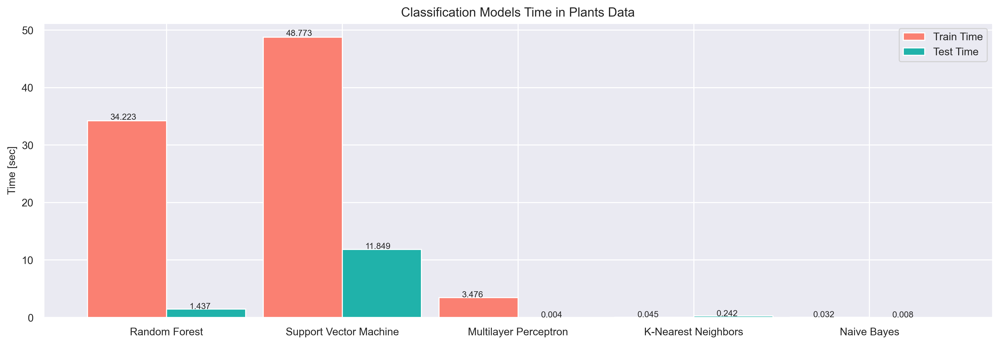

In [122]:
# Plot time results
results_summary = pd.read_csv("PlantsData/results_summary.csv")

colors = ['salmon','lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(.Time)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Time in Plants Data', fontsize=12)
ax.legend(['Train Time', 'Test Time'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Time [sec]', fontsize=10)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.13, p.get_height() * 1.005), fontsize=8)